# Domaća zadaća 3
#### Rok za predaju: 30. ožujka, 2022. u 9:00h
Zadaću trebate riješiti tako da u Teams assignment priložite bilježnicu s rješenjima ili postavite poveznicu na Google Colab bilježnicu.

Pokušajte matematičke izrate napisati u $\LaTeX$-u. Ako budete imali problema, napišite rješenje na papiru i dodajte sliku u Markdown ćeliju.

Kao $\LaTeX$ referencu možete koristiti knjigu [Ne baš tako kratak uvod u TEX](http://www.mathos.unios.hr/images/uploads/798.pdf). Za Markdown pogledajte [Markdown cheatsheet](https://enterprise.github.com/downloads/en/markdown-cheatsheet.pdf).

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.svm import SVC, LinearSVC

# Ovdje učitajte dodatne biblioteke koje budete koristili

## Zadatak 1 (5 bodova)
**Hinge-loss** funkcija $\ell_{hinge} : \mathbb{R} \to \mathbb{R}$ je zadana s
$$
\ell_{hinge}(x) = \max{(0, 1 - x)}.
$$
Dokažite da je ta funkcija konveksna. Koristeći *matplotlib* nacrtajte graf te funkcije.

Provjerimo vrijedi li za svaki x i y sljedeca nejednakost 
$$
f(\frac{x+y}{2})\leq \frac{f(x)+f(y)}{2}
$$

Uzet cemo proizvoljne $x i y  \in \mathbb{R}$
$$
\ell_{hinge}(\frac{x+y}{2}) = \max{(0,1-(\frac{x+y}{2}))} = \max{(0,\frac{2}{2}+\frac{-x-y}{2})}
$$
Pregrupiramo li malo dobivamo 
$$
=max{(0,\frac{1-x}{2}+\frac{1-y}{2})} \leq
$$
Sledece izlucimo dvojku i razdvojimo zbroj stime da onda stavljamo znak $\leq$
$$
\leq \frac{1}{2} [max{(0,1-x)}+ max{(0,1-y)}] = \frac{\ell_{hinge}(x)+\ell_{hinge}(y)}{2} 
$$
I time smo pokazali da je funkcija Hinge-loos konveksna


In [ ]:
x = np.linspace(-100,100, 10000)
y= np.max(0,1-x)
plt.plot(x,y)
plt.show()

---
Ovdje napišite svoj odgovor.

## Zadatak 2 (15 bodova)
Na predavanju i vježbama zadali smo optimizacijski problem 
$$
\textrm{argmin}_{\Theta, \theta_0, \xi}\frac{1}{2}||\Theta||^2 + C\sum\limits_{i=1}^m \xi_i
$$
 
$$
\text{  uz uvjet  } y^{(i)}(\Theta^T x^{(i)} + \theta_0) \geq 1 - \xi_i \textrm{ i } \xi_i \geq 0, \text{ }  i = 1, 2, \dots, m,
$$

Promotrite sljedeći optimizacijski problem:
$$
\textrm{argmin}_{\Theta, \theta_0}\frac{1}{2}||\Theta||^2 + C\sum\limits_{i=1}^m\ell_{hinge}(y^{(i)}(\Theta^T x^{(i)} + \theta_0)).
$$

Dokažite da su ovi optimizacijski problemi ekvivalentni. Drugim riječima:
 1. Ako je $(\Theta^*, \theta_0^*, \xi^*)$ rješenje prvog optimizacijskog problema, onda je $(\Theta^*, \theta_0^*)$ rješenje drugog optimizacijskog problema.
 2. Ako je $(\Theta^*, \theta_0^*)$ rješenje drugog optimizacijskog problema, onda postoji $\xi^*$ takav da je $(\Theta^*, \theta_0^*, \xi^*)$ rješenje prvog optimizacijskog problema.
 
 Parametar $\xi$ ovdje promatramo kao vektor $(\xi_1, \dots, \xi_m)^T$.

Pokazimo ekvivalentnost ovih gore optimizacijskih problema.
Da bi to napravili dovoljno je pokazati da je $\ell_{hinge}(y^{(i)}(\Theta^T x^{(i)} + \theta_0)) = \xi_i$
$$
\textrm{argmin}_{\Theta, \theta_0, \xi}\frac{1}{2}||\Theta||^2 + C\sum\limits_{i=1}^m \xi_i
$$
 
$$
\text{  uz uvjet  } y^{(i)}(\Theta^T x^{(i)} + \theta_0) \geq 1 - \xi_i \textrm{ i } \xi_i \geq 0, \text{ }  i = 1, 2, \dots, m,
$$
$$
\xi_i \geq 1 - y^{(i)}(\Theta^T x^{(i)} + \theta_0)
$$
Lijeva strana je uvijek pozitivna pa mora biti desna
Sto znaci da vrijednosti od $y^{(i)}(\Theta^T x^{(i)} + \theta_0)$ moraju biti u intervalu od $[1,- \infty]$ 

Ako bi pogledali 
$$
\ell_{hinge}(y^{(i)}(\Theta^T x^{(i)} + \theta_0)) = max (0 , 1 - y^{(i)}(\Theta^T x^{(i)} + \theta_0) )
$$
vidimo da funkcija $\ell_{hinge}$ mozemo zakljuciti da je ona zapravo jednaka $\xi_i$

---
## Zadatak 3 (5 bodova)
Logistička funkcija je zadana s 
$$
\sigma{(x)} = \frac{1}{1 + \exp{(-x)}}.
$$
1. Dokažite da vrijedi $\sigma{(-x)} = 1 - \sigma{(x)}$.

2. Izračunajte derivaciju funkcije $\sigma$.

$$
\sigma{(-x)} =  \frac{1}{1 + \exp{(x)}}
$$
S druge strane 
$$
1 - \sigma{(x)} = 1 - \frac{1}{1 + \exp{(-x)}} = \frac{1+\exp{(-x)}-1}{1+\exp{(-x)}}= \frac{1}{\frac{1+\exp{(-x)}}{\exp(-x)}} = \frac{1}{\frac{1}{\exp{(-x)}}+1} = \frac{1}{1 + \exp{(x)}}
$$

Derivacija funkcije $\sigma{(x)}$ bi bila 
$$
\sigma{(x)}' = \frac {\exp{(-x)} }{(1+\exp{(-x)})^2 }

$$

---
## Zadatak 4 (10 bodova)
Izračunajte gradijent *maximum likelihood* kriterijske funkcije $J : \mathbb{R}^n \to \mathbb{R}$ zadane s
$$
J(\Theta) = \sum_{i=1}^m\log{}(1 + \exp(-y^{(i)}\Theta^Tx^{(i)})).
$$

Gradijent maximum likelihood kriterijske funkcije J bi izgledao 

$$\nabla J(\Theta) = \left[\begin{array}{c}
\cfrac{\partial J}{\partial \theta_0}\\
\cfrac{\partial J}{\partial \theta_1}\\
\vdots \\
\cfrac{\partial J}{\partial \theta_n} 
\end{array}\right] =  \left[\begin{array}{c}
\sum\limits_{i=1}^{m} \frac{\exp{(-y^{(i)}\Theta^Tx^{(i)})}(-y^{(i)})}{1+\exp{(-y^{(i)}\Theta^Tx^{(i)})}} \\
\sum\limits_{i=1}^{m} \frac{\exp{(-y^{(i)}\Theta^Tx^{(i)})}(-y^{(i)}x^{(i)})}{1+\exp{(-y^{(i)}\Theta^Tx^{(i)})}} \\
\vdots \\
\sum\limits_{i=1}^{m}\frac{\exp{(-y^{(i)}\Theta^Tx^{(i)})}(-y^{(i)}x^{(i)})}{1+\exp{(-y^{(i)}\Theta^Tx^{(i)})}}
\end{array}\right] 

---
## Zadatak 5 (15 bodova)
Učitajte podatke iz prošle zadaće (*A.csv*, *B.csv* i *C.csv*). Za svaki od njih učinite sljedeće:

1. Konstruirajte SVM model primjenom *LinearSVC* klase iz *sklearn.svm*.

2. Ispišite parametre $\theta_0$ i $\Theta$.

3. Izračunajte i ispišite potporne vektore.

4. Izračunajte geometrijsku marginu.

5. Grafički prikažite podatke, dobivenu hiperravninu koja razdvaja podatke, te potporne vektore.

6. Usporedite vrijednosti geometrijske margine dobivene perceptron algoritmom i SVM modelom. Za perceptron algoritam možete iskoristiti implementaciju iz prošle zadaće (odnosno vježbi).

In [ ]:
class PerceptronWithPictures:
    def __init__(self):
        self.theta = None
        self.k_total = None
        
    def fit(self, X, y, max_iter=100000):       
        m = X.shape[0]
        n = X.shape[1] + 1
        assert (X.shape[1] == 2)
        self.theta = np.zeros(n)
        
        X = np.concatenate((np.ones((m, 1)), X), axis=1)
        self.k_total = 0
        while self.k_total < max_iter:
            k = 0
            for i in range(m):
                if y[i] != np.sign(np.dot(self.theta, X[i])):
                    k += 1
                    self.theta += (y[i] * X[i])
                    plt.title(f'Iteracija {self.k_total + k}')
                    self.draw(X[:, 1:], y, hyperplane=True)
            self.k_total += k
            if k == 0:
                break
                
    def accuracy(self, X, y):
        m = X.shape[0]
        cnt = 0
        X = np.concatenate((np.ones((m, 1)), X), axis=1)
        for i in range(m):
            if y[i] == np.sign(np.dot(self.theta, X[i])):
                cnt += 1
        return cnt / m
    
    def draw(self, X, y, hyperplane=False):
        assert (X.shape[1] == 2)
        assert (hyperplane == False or self.theta is not None)
        plt.scatter(X[:, 0], X[:, 1], c=y)
        if hyperplane:
            xx = np.linspace(np.min(X[:, 0]), np.max(X[:, 0]), 1000)
            yy = -(self.theta[1] / self.theta[2]) * xx - (self.theta[0] / self.theta[2])
            plt.plot(xx, yy)
        plt.show()

In [ ]:
pda = pd.read_csv('./Podaci./A.csv')
X_a = pda[['x1','x2']].to_numpy()
y_a = pda['y'].to_numpy()
reg_a = LinearSVC()
reg_a.fit(X_a,y_a)
print(reg_a.coef_)
print(reg_a.intercept_)
dec_func_a = reg_a.decision_function(X_a)
support_vector_indices = np.where(np.abs(dec_func_a) <= 1 + 1e-15)
support_vectors = X_a[support_vector_indices]
print(support_vectors)

plt.scatter(X_a[:,0],X_a[:,1],c=y_a)
ax = plt.gca()
xlim = ax.get_xlim()
ylim = ax.get_ylim()
xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 1000),
                     np.linspace(ylim[0], ylim[1], 1000))
Z = reg_a.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z, levels=[-100, -1,0,1, 100], alpha=0.5,
           linestyles=['--', '-', '--'])
plt.scatter(support_vectors[:, 0], support_vectors[:, 1], s=100, linewidth=1,
           facecolors='none', edgecolors='k')



In [ ]:
print(1/np.linalg.norm(reg_a.coef_))
perc = PerceptronWithPictures()
perc.fit(X_a,y_a)
print(perc.theta)
print(1/np.linalg.norm(perc.theta[1:]))

Geometrijska margina Perceptrona je vrlo mala 0.015517514206971039 dok je geo margina dobivena SVM modelom 3.3544980532894235 puno veca sto znaci da nam je SVM puno bolje podijelio podatke 

In [ ]:
pdb = pd.read_csv('./Podaci./B.csv')
X_b = pdb[['x1','x2']].to_numpy()
y_b = pdb['y'].to_numpy()
reg_b = LinearSVC()
reg_b.fit(X_b,y_b)
print(reg_b.coef_)
print(reg_b.intercept_)
dec_func_b = reg_b.decision_function(X_b)
support_vector_indices = np.where(np.abs(dec_func_b) <= 1 + 1e-15)
support_vectors = X_b[support_vector_indices]
print(support_vectors)
print(1/np.linalg.norm(reg_b.coef_))
plt.scatter(X_b[:,0],X_b[:,1],c=y_b)
ax = plt.gca()
xlim = ax.get_xlim()
ylim = ax.get_ylim()
xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 1000),
                     np.linspace(ylim[0], ylim[1], 1000))
Z = reg_b.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z, levels=[-100, -1,0,1, 100], alpha=0.5,
           linestyles=['--', '-', '--'])
plt.scatter(support_vectors[:, 0], support_vectors[:, 1], s=100, linewidth=1,
           facecolors='none', edgecolors='k')

In [ ]:
print(1/np.linalg.norm(reg_b.coef_))
perc = PerceptronWithPictures()
perc.fit(X_b,y_b)
print(perc.theta)
print(1/np.linalg.norm(perc.theta[1:]))

In [ ]:
pda = pd.read_csv('./Podaci./C.csv')
X_a = pda[['x1','x2']].to_numpy()
y_a = pda['y'].to_numpy()
reg_a = LinearSVC()
reg_a.fit(X_a,y_a)
print(reg_a.coef_)
print(reg_a.intercept_)
dec_func = reg_a.decision_function(X_a)
support_vector_indices = np.where(np.abs(dec_func) <= 1 + 1e-15)
support_vectors = X_a[support_vector_indices]
print(support_vectors)
print(1/np.linalg.norm(reg_a.coef_))
plt.scatter(X_a[:,0],X_a[:,1],c=y_a)
ax = plt.gca()
xlim = ax.get_xlim()
ylim = ax.get_ylim()
xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 1000),
                     np.linspace(ylim[0], ylim[1], 1000))
Z = reg_a.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z, levels=[-100, -1,0,1, 100], alpha=0.5,
           linestyles=['--', '-', '--'])
plt.scatter(support_vectors[:, 0], support_vectors[:, 1], s=100, linewidth=1,
           facecolors='none', edgecolors='k')

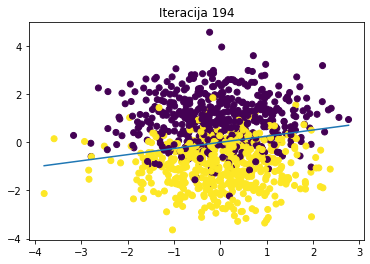

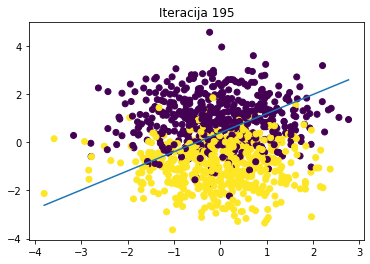

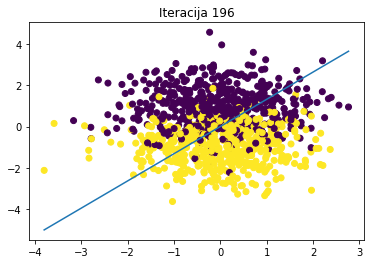

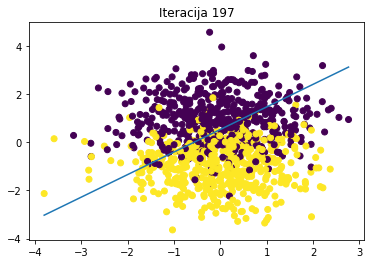

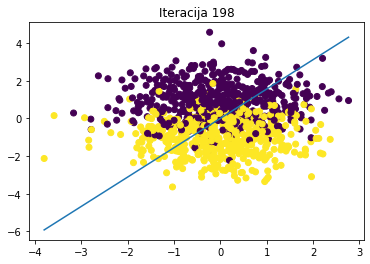

...

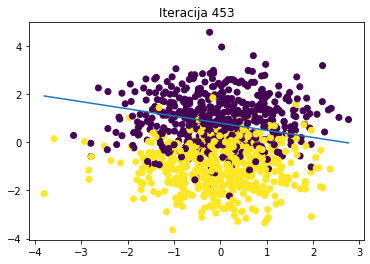

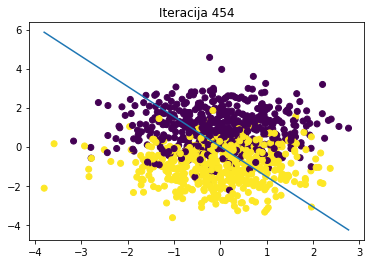

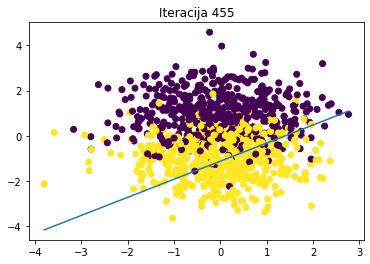

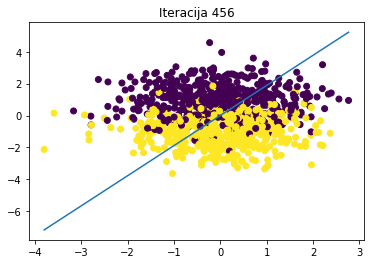

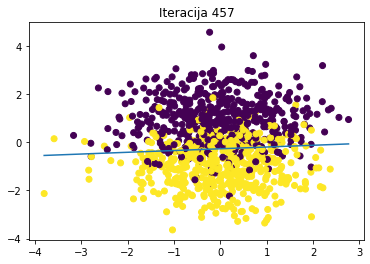

In [78]:
print(1/np.linalg.norm(reg_a.coef_))
perc = PerceptronWithPictures()
perc.fit(X_a,y_a)
print(perc.theta)
print(1/np.linalg.norm(perc.theta[1:]))

---
## Zadatak 6 (10 bodova)
Učitajte podatke iz skupa *B.csv*. Promotrite što se događa s rezultatima SVM modela ako slučajnim odabirom uklonite dio podataka:

1. Slučajnim odabirom odaberite 1000 (od ukupno 2000) točaka i pripadnih klasa.

2. Konstruirajte SVM model primjenom *SVC* klase iz *sklearn.svm* sa `kernel='linear'`.

3. Grafički prikažite podatke, dobivenu hiperravninu koja razdvaja podatke, te potporne vektore.

**Ovaj proces ponovite 10 puta** i interpretirajte razlike ili sličnosti u dobivenim rezultatima. Što možete zaključiti o ulozi potpornih vektora?

[[-0.50329364  0.50331933]]
[-1.0069542]
1.404922837353341
[[12.79416478 12.80786571]
 [ 5.00644063  8.99314232]
 [12.65785892 16.64416419]
 [ 7.00069731 10.9886919 ]
 [12.65785892 16.64416419]]


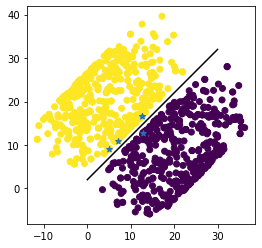

In [133]:
pdb_bb = pd.read_csv('./Podaci./B.csv')
pdb_bb.shape[0]
random=pdb_bb.iloc[np.random.randint(low=0,high=pdb_bb.shape[0],size = 1000)]

X_bb = random[['x1','x2']].to_numpy()
y_bb = random['y'].to_numpy()

clf = SVC(kernel='linear')
clf.fit(X_bb, y_bb)
print(clf.coef_)
print(clf.intercept_)
print(1 / np.linalg.norm(clf.coef_))
print(clf.support_vectors_)


xx = np.linspace(0, 30, 1000)
yy = -(clf.coef_[0][0] / clf.coef_[0][1]) * xx - clf.intercept_[0] / clf.coef_[0][1]
plt.plot(xx, yy, 'k-')
plt.gca().set_aspect('equal')
plt.scatter(X_bb[:, 0], X_bb[:, 1], c=y_bb)
plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], marker='*')
plt.show()

Zakljucujem da se broj potpornih vektora mijenja svakim pokretanjem kao i njihove vrijednosti. U geometrijskom smislu to su vektori koji su najblizi optimalnoj hiperravnini